In [ ]:
from datetime import datetime

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from cartopy.io.img_tiles import GoogleTiles
from cartopy.mpl.geoaxes import GeoAxes
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.markers import MarkerStyle
import torch
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from torch import nn, optim
from torch.nn import MSELoss
from torch.utils.data import DataLoader, TensorDataset

from bq.queries import run_query
from sklearn.model_selection import train_test_split
import cartopy.crs as ccrs
import cartopy.feature as cfeature

In [272]:
# GDelt project
events = pd.DataFrame(
	run_query(
		"""
		select ActionGeo_Lat, ActionGeo_Long, SQLDATE from `gdelt-bq.gdeltv2.events`
		where ActionGeo_Lat is not null and ActionGeo_Long is not null
		order by rand() desc
		limit 100000
		""",
		debug=True
	)
)

base_events = events.copy()

# Afficher les premières lignes des données
events.sample(n=20)

Running query: select ActionGeo_Lat, ActionGeo_Long, SQLDATE from `gdelt-bq.gdeltv2.events` where ActionGeo_Lat is not null and ActionGeo_Long is not null order by rand() desc limit 100000
Request already cached, returning cached data.


,ActionGeo_Lat,ActionGeo_Long,SQLDATE
52433,1.486940,32.623100,20170510
19021,-41.000000,174.000000,20160218
30939,23.000000,-102.000000,20170717
7624,51.450000,6.733330,20150720
96717,14.208600,-1.853030,20180213
52490,60.000000,100.000000,20210203
79809,54.000000,-2.000000,20160605
84393,38.000000,-97.000000,20160304
45307,15.588100,32.534200,20170101
28314,37.000000,127.500000,20151222


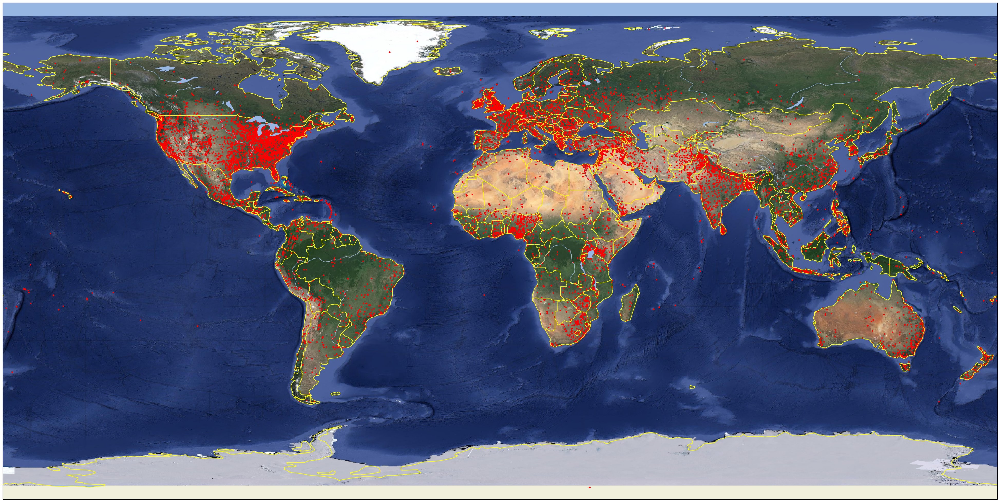

In [273]:
# plot a map of the events
fig = plt.figure(figsize=(50, 30))
ax: GeoAxes = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

ax.set_extent([-180, 180, -90, 90], crs=ccrs.PlateCarree())
ax.coastlines(linestyle='-', color='yellow', linewidth=1.5)
ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.BORDERS, linestyle='-', edgecolor='yellow', linewidth=1.5)
ax.add_feature(cfeature.LAKES)
ax.add_feature(cfeature.RIVERS)
tiler = GoogleTiles(style="satellite", cache=True)
ax.add_image(tiler, 4)

ax.scatter(
	events['ActionGeo_Long'],
	events['ActionGeo_Lat'],
	transform=ccrs.PlateCarree(),
	color='red',
	marker='.',
)

plt.show()

In [274]:
# Normaliser les données
scaler = StandardScaler()
normalized_data = scaler.fit_transform(events[['ActionGeo_Lat', 'ActionGeo_Long', 'SQLDATE']])

events.sample(50)

,ActionGeo_Lat,ActionGeo_Long,SQLDATE
364,44.23940,-114.510000,20170627
93990,30.00000,70.000000,20160523
55293,16.45000,120.550000,20161118
62464,53.38330,-2.883330,20151223
18163,15.00000,19.000000,20190529
23672,24.64080,46.772800,20180821
78348,1.28389,103.858000,20150302
35692,-20.00000,30.000000,20170509
53371,40.37360,-82.775500,20230425
67252,-33.93180,151.076000,20180221


In [275]:
# Découper les données en données d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(normalized_data, normalized_data, test_size=0.2, random_state=42)

# Convertir en tensors PyTorch
X_train_tensor = torch.FloatTensor(X_train).unsqueeze(1)
y_train_tensor = torch.FloatTensor(y_train)
X_test_tensor = torch.FloatTensor(X_test).unsqueeze(1)
y_test_tensor = torch.FloatTensor(y_test)

# Créer des DataLoaders
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)


# Fonction pour inverser la normalisation
def inverse_normalize(normalized_data: torch.Tensor) -> torch.Tensor:
	return scaler.inverse_transform(normalized_data)

# Assurer que X_train_tensor et X_test_tensor ont la forme correcte
X_train_tensor = X_train_tensor.unsqueeze(1)  # Add a sequence dimension with unsqueeze
X_test_tensor = X_test_tensor.unsqueeze(1)  # Add a sequence dimension with unsqueeze

In [276]:
# Définir le modèle LSTM
class EventPredictor(nn.Module):
	def __init__(self, input_size: int, hidden_size: int, output_size: int, num_layers: int) -> None:
		super().__init__()
		self.hidden_size = hidden_size
		self.num_layers = num_layers
		self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
		self.fc = nn.Linear(hidden_size, output_size)

	def forward(self, x: torch.Tensor) -> torch.Tensor:
		h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
		c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
		out, _ = self.lstm(x, (h0, c0))
		out = self.fc(out[:, -1, :])
		return out

# Hyperparamètres
input_size = 3  # Latitude, Longitude, Date
hidden_size = 100  # Augmenté de 50 à 100
output_size = 3  # Prédire Latitude, Longitude, Date
num_layers = 2  # Augmenté de 1 à 2

# Instancier le modèle
model = EventPredictor(input_size, hidden_size, output_size, num_layers)
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-5)

In [279]:
# Entraîner le modèle
num_epochs = 10
print(f"Training for {num_epochs} epochs...")
for epoch in range(num_epochs):
	model.train()
	for batch_X, batch_y in train_loader:
		outputs = model(batch_X)
		loss = criterion(outputs, batch_y)
		optimizer.zero_grad()
		loss.backward()
		optimizer.step()

	if (epoch + 1) % (num_epochs // 5) == 0:
		print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {loss.item():.4f}')

print(f"Training finished!")

Training for 10 epochs...
Epoch [2/10], Loss: 0.0001
Epoch [4/10], Loss: 0.0001
Epoch [6/10], Loss: 0.0000
Epoch [8/10], Loss: 0.0047
Epoch [10/10], Loss: 0.0001
Training finished!


In [284]:
# Évaluation
model.eval()
with torch.no_grad():
	predictions = []
	for batch_X, _ in test_loader:
		outputs = model(batch_X)
		predictions.append(outputs.numpy())

predictions = np.concatenate(predictions)
predictions_original = inverse_normalize(predictions)

predictions = predictions_original[:20]

# Afficher les prédictions
predictions

array([[ 3.61921959e+01, -1.19804329e+02,  2.01604860e+07],
       [ 3.50490341e+01,  3.84254608e+01,  2.02410860e+07],
       [ 4.28494415e+01,  1.25805645e+01,  2.01909120e+07],
       [ 4.30306129e+01, -8.57832794e+01,  2.01703440e+07],
       [ 2.86461945e+01,  7.67678833e+01,  2.01805640e+07],
       [-1.55653105e+01, -5.75081291e+01,  2.02101740e+07],
       [ 6.18436852e+01,  1.01835365e+01,  2.02004060e+07],
       [ 4.22320213e+01, -7.50717545e+01,  2.01599400e+07],
       [ 4.55262642e+01, -7.59026108e+01,  2.02010820e+07],
       [ 5.25467720e+01,  5.63705587e+00,  2.01904940e+07],
       [ 4.86296959e+01,  7.60238695e+00,  2.02010800e+07],
       [ 4.01543159e+01, -1.11921654e+02,  2.01707080e+07],
       [ 3.61260452e+01, -8.59039841e+01,  2.01502440e+07],
       [ 1.75244122e+01,  7.77215652e+01,  2.01703100e+07],
       [ 3.01127625e+01,  3.06618824e+01,  2.01600680e+07],
       [ 4.19317627e+01, -8.78740768e+01,  2.02008920e+07],
       [ 5.11286926e+01, -3.97998452e+00

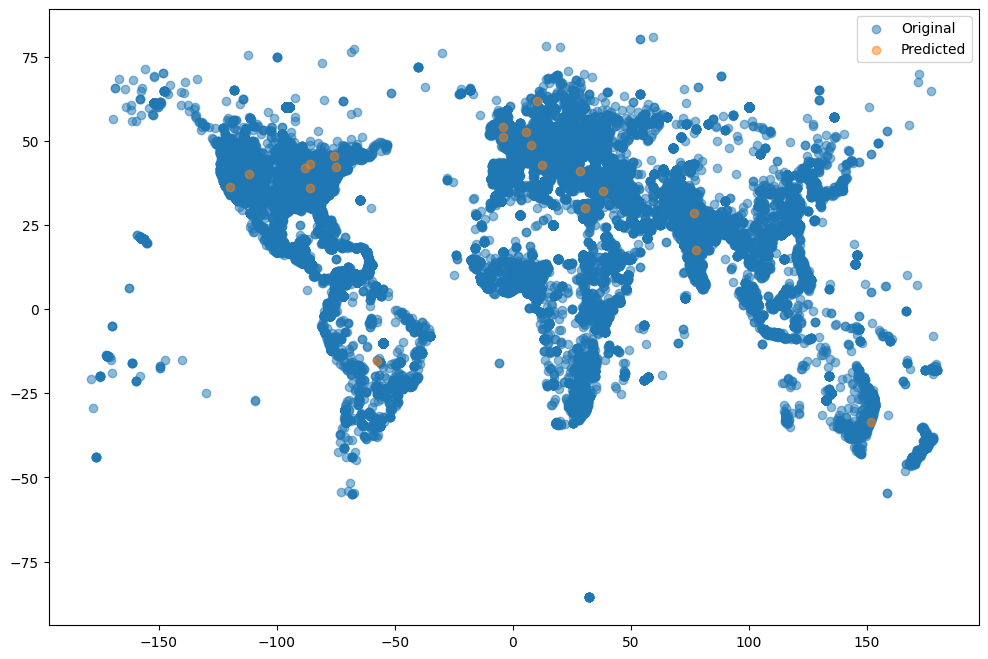

In [286]:
# Affichage des résultats
plt.figure(figsize=(12, 8))
plt.scatter(events['ActionGeo_Long'], events['ActionGeo_Lat'], alpha=0.5, label='Original')
plt.scatter(predictions[:, 1], predictions[:, 0], alpha=0.5, label='Predicted')
plt.legend()
plt.show()

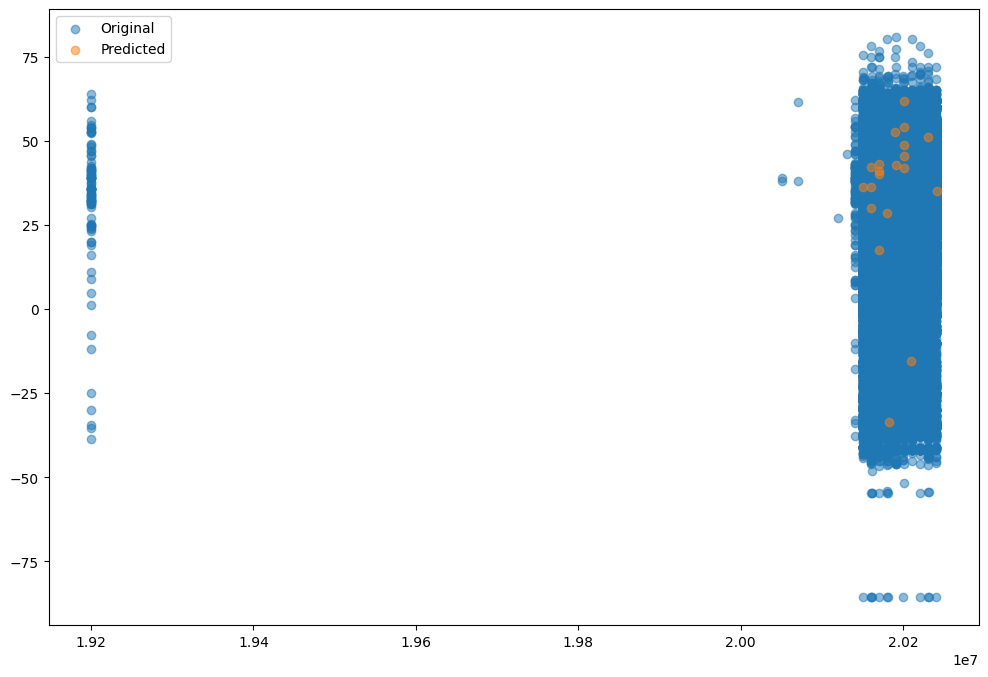

In [309]:
# Plot a graph of SQLDATE
plt.figure(figsize=(12, 8))
plt.scatter(events['SQLDATE'], events['ActionGeo_Lat'], alpha=0.5, label='Original')
plt.scatter(predictions[:, 2], predictions[:, 0], alpha=0.5, label='Predicted')
plt.legend()
plt.show()

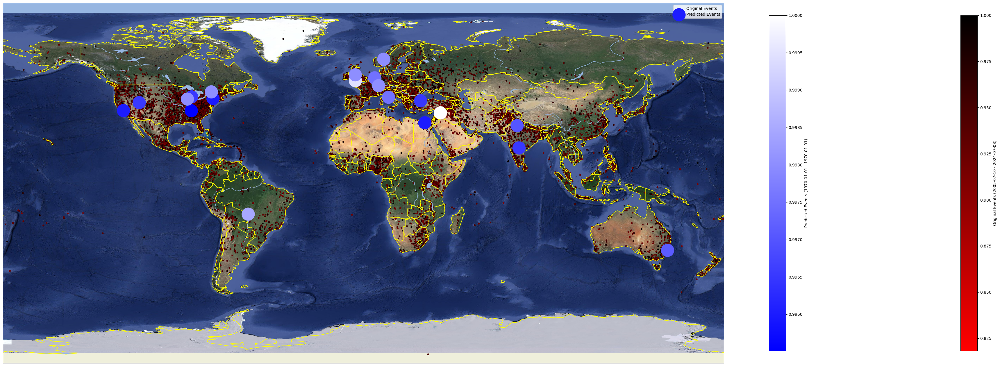

In [322]:
from datetime import datetime

# Plot the map with the original and predicted values
fig = plt.figure(figsize=(50, 30))
ax: GeoAxes = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

# Create custom color maps
# Red to black for original events
# Blue to white for predicted events
cmap_original = LinearSegmentedColormap.from_list('original', ['red', 'black'])
cmap_predicted = LinearSegmentedColormap.from_list('predicted', ['blue', 'white'])

ax.set_extent([-180, 180, -90, 90], crs=ccrs.PlateCarree())
ax.coastlines(linestyle='-', color='yellow', linewidth=1.2)
ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.BORDERS, linestyle='-', edgecolor='yellow', linewidth=1.5)
ax.add_feature(cfeature.LAKES)
ax.add_feature(cfeature.RIVERS)
tiler = GoogleTiles(style="satellite", cache=True)
ax.add_image(tiler, 4)

base_events['timestamp'] = pd.to_datetime(base_events['SQLDATE'], format='%Y%m%d').astype('int64')
min_sql_date = base_events['timestamp'].min()
max_sql_date = base_events['timestamp'].max()

# Get the first and last dates
first_date = pd.to_datetime(events['timestamp'].min(), unit='ns').strftime('%Y-%m-%d')
last_date = pd.to_datetime(events['timestamp'].max(), unit='ns').strftime('%Y-%m-%d')

# Assuming 'predictions' is a DataFrame or array with a date column
first_predicted_date = pd.to_datetime(predictions[:, 2].min(), unit='ns').strftime('%Y-%m-%d')
last_predicted_date = pd.to_datetime(predictions[:, 2].max(), unit='ns').strftime('%Y-%m-%d')

# Supprimer les valeurs absolues au nivaeu de la date
# Remove dates much older than 1950
events = base_events[base_events['timestamp'] > 1]

# Normalize 'DATA' values to range from 0 to 1
norm = plt.Normalize(vmin=min_sql_date, vmax=max_sql_date)
events.loc[:, 'normalized_timestamp'] = norm(events['timestamp'])

# Plot original events
original_scatter = ax.scatter(
	events['ActionGeo_Long'],
	events['ActionGeo_Lat'],
	transform=ccrs.PlateCarree(),
	c=events['normalized_timestamp'],
	cmap=cmap_original,
	marker='.',
	label='Original Events'
)

# Plot predicted events
predicted_scatter = ax.scatter(
	predictions[:, 1],
	predictions[:, 0],
	transform=ccrs.PlateCarree(),
	c=predictions[:, 2] / predictions[:, 2].max(),
	cmap=cmap_predicted,
	marker='o',
	s=1000,  # Increase size of the dots
	label='Predicted Events',
	zorder=10
)
# Update the colorbar labels
plt.colorbar(original_scatter, ax=ax, label=f'Original Events ({first_date} - {last_date})', shrink=0.5)
plt.colorbar(predicted_scatter, ax=ax, label=f'Predicted Events ({first_predicted_date} - {last_predicted_date})', shrink=0.5)

plt.legend()
plt.show()